In [1]:
import os, sys, glob
import numpy as np
from scipy import sparse
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import lightkurve as lk
path = os.path.dirname(os.getcwd())

sys.path.append(path)
from kepler_apertures import KeplerFFI, KeplerPSF, EXBAMachine

sys.path.append('%s/Work/BAERI/ADAP/psfmachine/' % os.environ['HOME'])
# from psfmachine import Machine
%load_ext line_profiler


Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


In [14]:
ch = 17
qu = 5
# psf = KeplerFFI(ffi_name="kplr2009115053616", channel=ch, plot=True, save=False)
psf = KeplerFFI(quarter=qu, channel=ch, plot=True, save=False)

Will query with this (ra, dec, radius, epoch):  [285.15754384] [46.05953267] [1.2319359258795979] 2010.3025742728546
Loading query from file...
../data/catalogs/ffi/5.000000/channel_17_gaia_xmatch.csv
Cleaning sources table...
Saturated pixels 2352
Bright pixels 53514
Total Gaia sources 8405


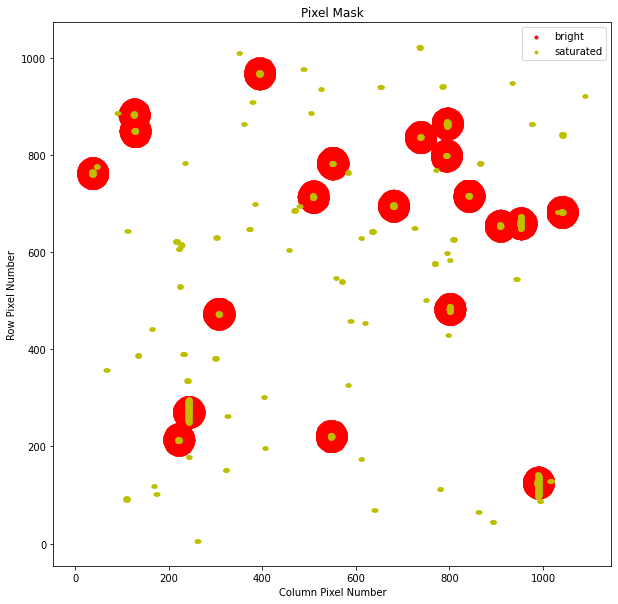

In [15]:
# plot rejected pixels due to saturation or bright-star halos
ax = psf.plot_pixel_masks()

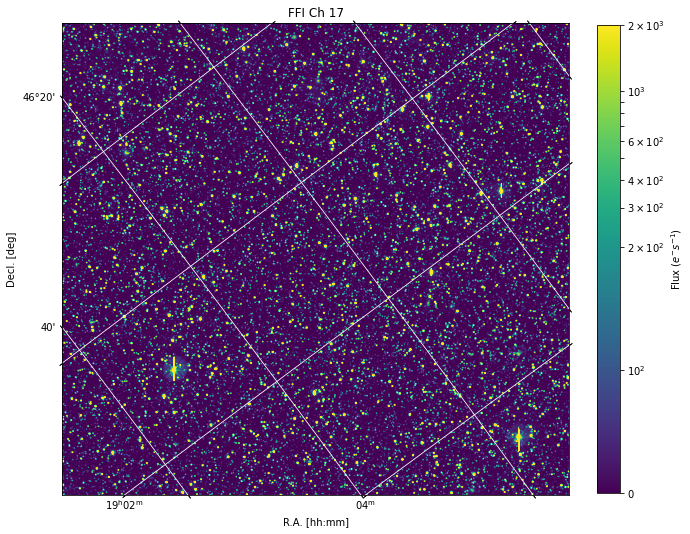

In [16]:
# plot FFI ch image
_ = psf.plot_image(sources=False)

In [17]:
# create sparse arrays for later use
psf._create_sparse()

Gaia sources: 100%|██████████| 8405/8405 [01:28<00:00, 95.37it/s] 


to polar coordinates...


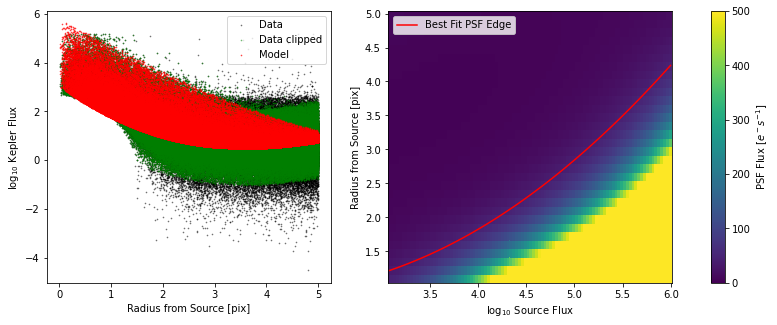

In [20]:
psf.show = True
psf.plot = True
psf.save = False
# find PSF edges as fn of flux to then limit the radius of the PSF fitting
radius = psf._get_source_mask(upper_radius_limit=5,
                              lower_radius_limit=1.1,
                              flux_cut_off=50,
                              dm_type="rf-quadratic")

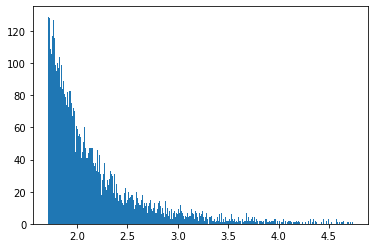

In [22]:
plt.hist(psf.radius, bins=500)
plt.show()

# Contaminated pixels:  3945


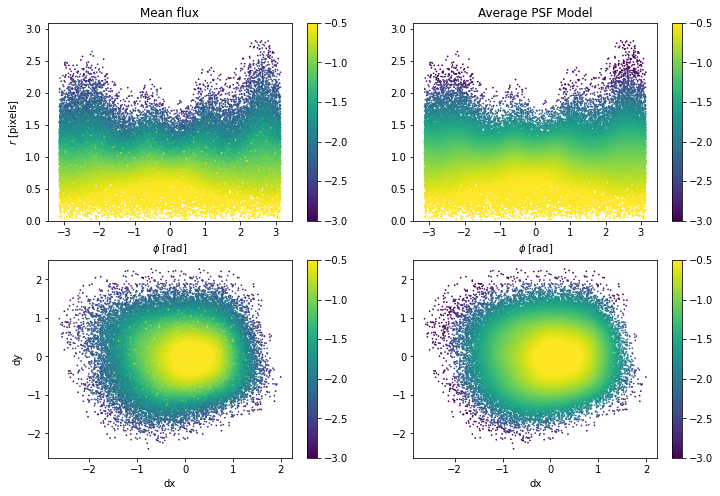

In [28]:
# fit PSF model in polar coordinates to the filtered/clean data
psf._build_psf_model(rknots=5, phiknots=15, flux_cut_off=1)

In [29]:
psf.rmax

2.526799784321512

In [23]:
psf.fit_model()

In [55]:
psf.save_catalog()

# Load EXBA masks data

In [2]:
qu = 5
ch = 48
exba = EXBAMachine(quarter=qu, channel=ch, magnitude_limit=20, gaia_dr=3)

TargetPixelFileCollection of 4 objects:
    0: KeplerTargetPixelFile Object (ID: 100002295)
    1: KeplerTargetPixelFile Object (ID: 100002296)
    2: KeplerTargetPixelFile Object (ID: 100002297)
    3: KeplerTargetPixelFile Object (ID: 100002298)
Loading query from file...
../data/catalogs/exba/5/channel_48_gaiadr3_xmatch.csv


In [3]:
exba

EXBA Patch:
	 Channel 48, Quarter 5, Gaia DR 3 sources 123

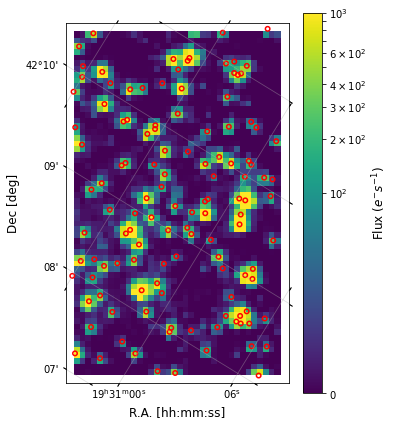

In [4]:
ax = exba.plot_image()
ax.set_title("")
ax.set_xlim(exba.col.min()-2, exba.col.max()+2)
ax.set_ylim(exba.row.min()-2, exba.row.max()+2)
ax.grid(True, alpha=.4)

plt.savefig("../data/figures/paper/EXBA_img_q%i_ch%02i.pdf" % (qu, ch), 
            format="pdf", bbox_inches="tight")
plt.show()

In [70]:
exba.tpfs[0].shape, exba.tpfs[1].shape, exba.tpfs[2].shape, exba.tpfs[3].shape

((4492, 60, 9), (4492, 60, 9), (4492, 60, 9), (4492, 60, 9))

## Create a PSF object

In [31]:
kpsf = KeplerPSF(quarter=qu, channel=ch)

../data/models/5/channel_10_psf_model.pkl


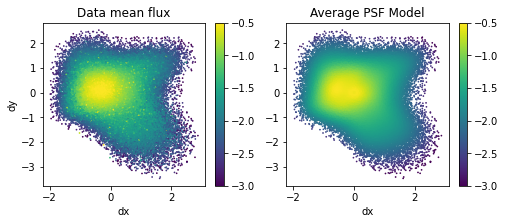

In [32]:
kpsf.plot_mean_PSF();

In [33]:
psf_exba = kpsf.evaluate_PSF(exba.flux, exba.dx, exba.dy, exba.gaia_flux[:, 0])
psf_exba

<68x2160 sparse matrix of type '<class 'numpy.float64'>'
	with 2646 stored elements in Compressed Sparse Row format>

In [34]:
for s in range(exba.sources.shape[0]):
    ap_mask, crwd, cmplt, cut = kpsf.optimize_aperture(psf_exba, idx=s, target_complet=.5, target_crowd=1.)
    exba.aperture_mask[s] = ap_mask
    exba.FLFRCSAP[s] = crwd
    exba.CROWDSAP[s] = cmplt
    exba.cut[s] = cut
exba.aperture_mask_2d = exba.aperture_mask.reshape(exba.N_sources, exba.N_row, exba.N_col)

In [46]:
exba.apply_flatten()

Applying CBVs to LCs:   0%|          | 0/73 [00:00<?, ?it/s]

Optimizing alpha


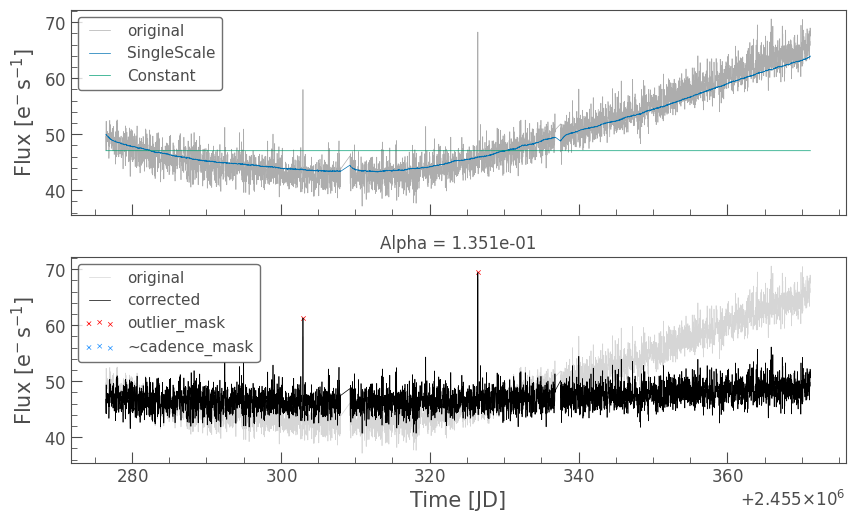

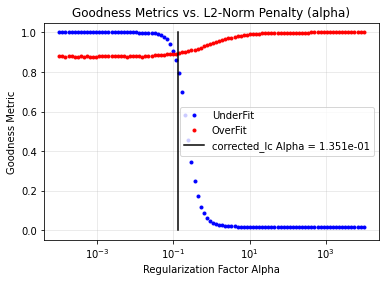

Applying CBVs to LCs:  14%|█▎        | 10/73 [04:03<09:09,  8.73s/it]  

Optimizing alpha


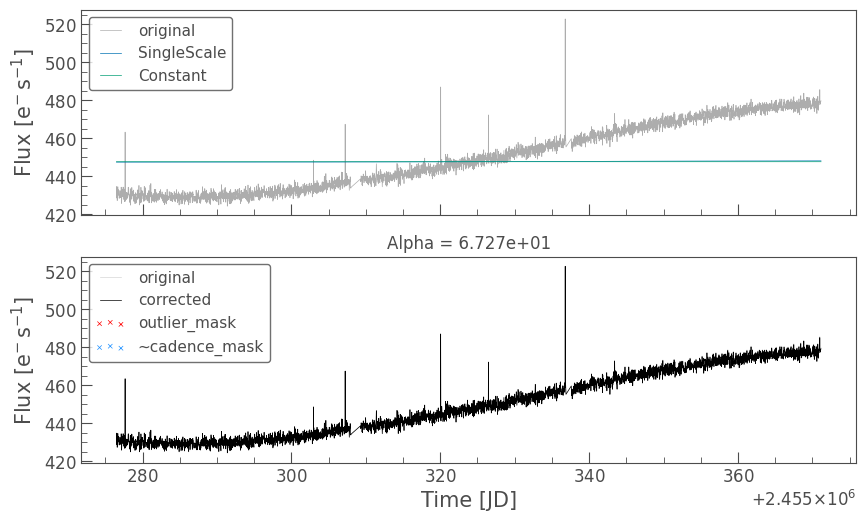

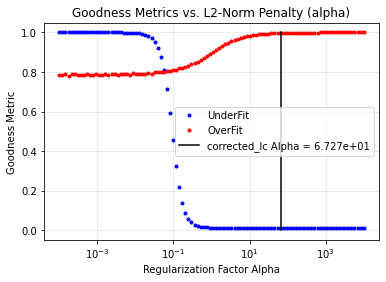

Applying CBVs to LCs:  27%|██▋       | 20/73 [08:13<06:04,  6.88s/it]  

Optimizing alpha


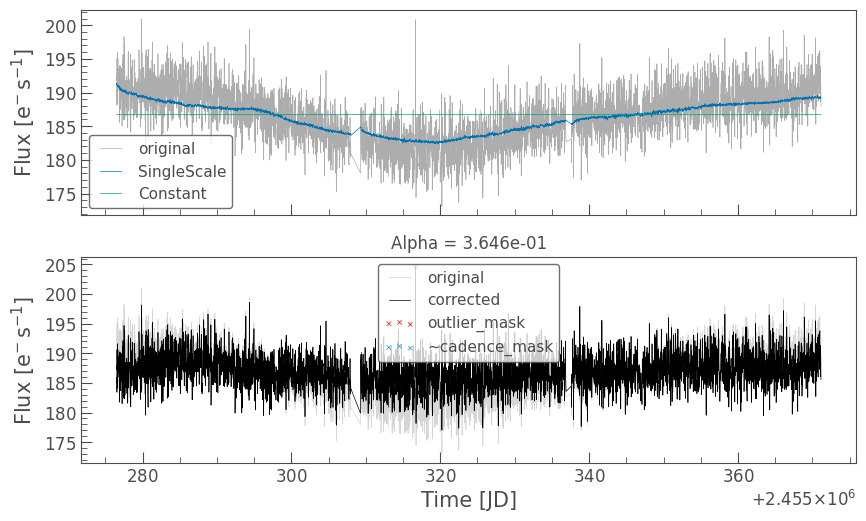

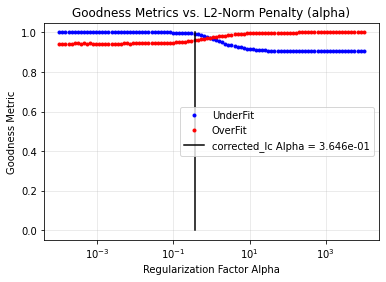

Applying CBVs to LCs:  41%|████      | 30/73 [10:24<02:20,  3.26s/it]

Optimizing alpha


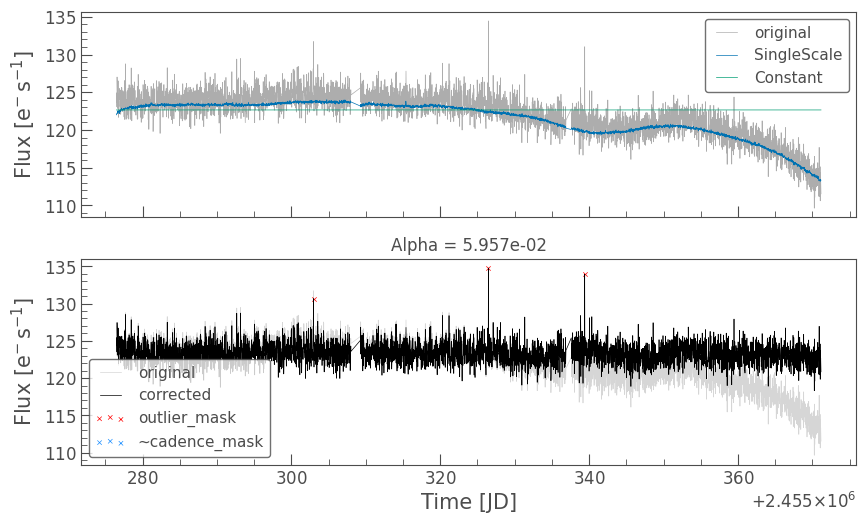

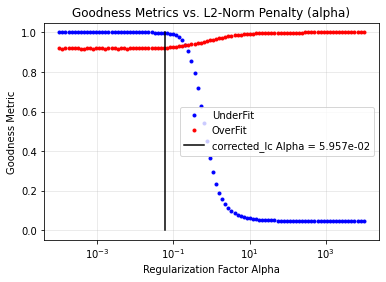

Applying CBVs to LCs:  55%|█████▍    | 40/73 [11:26<01:28,  2.69s/it]

Optimizing alpha


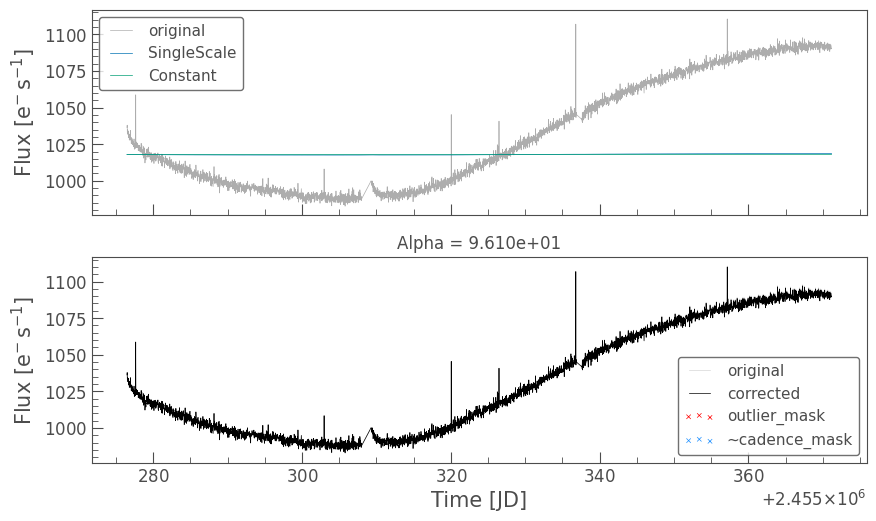

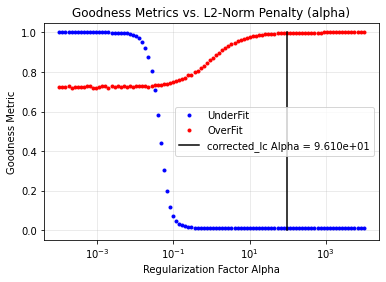

Applying CBVs to LCs:  68%|██████▊   | 50/73 [12:40<01:12,  3.13s/it]

Optimizing alpha


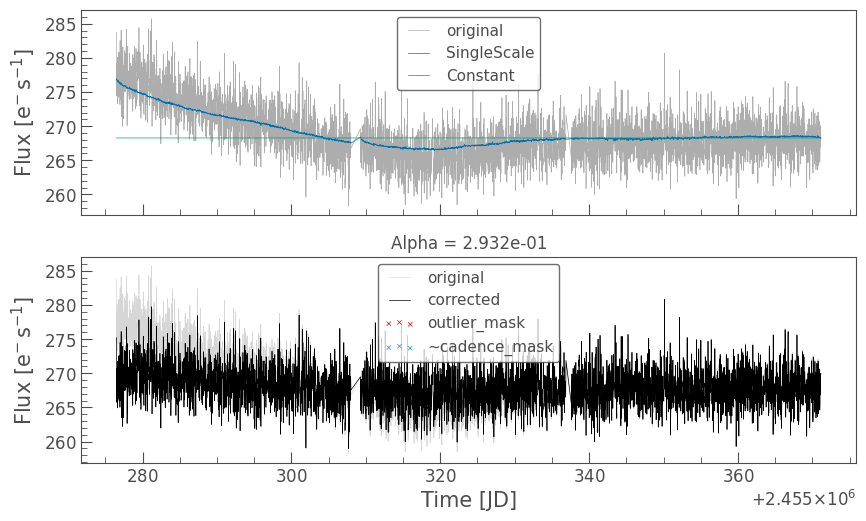

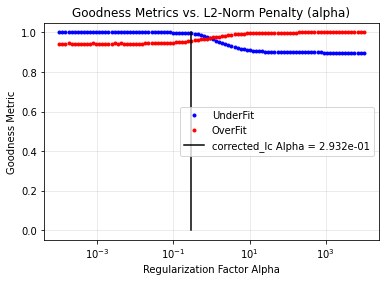

Applying CBVs to LCs:  82%|████████▏ | 60/73 [13:59<00:43,  3.31s/it]

Optimizing alpha


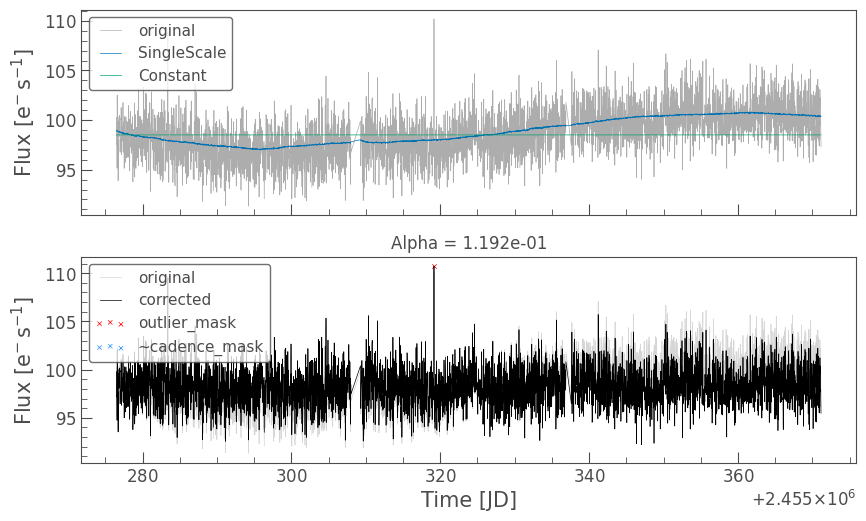

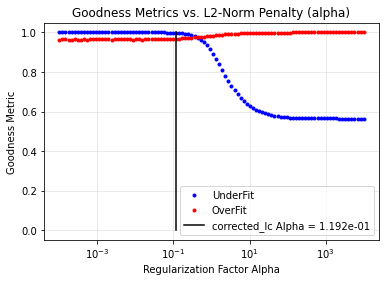

Applying CBVs to LCs:  96%|█████████▌| 70/73 [15:19<00:10,  3.66s/it]

Optimizing alpha


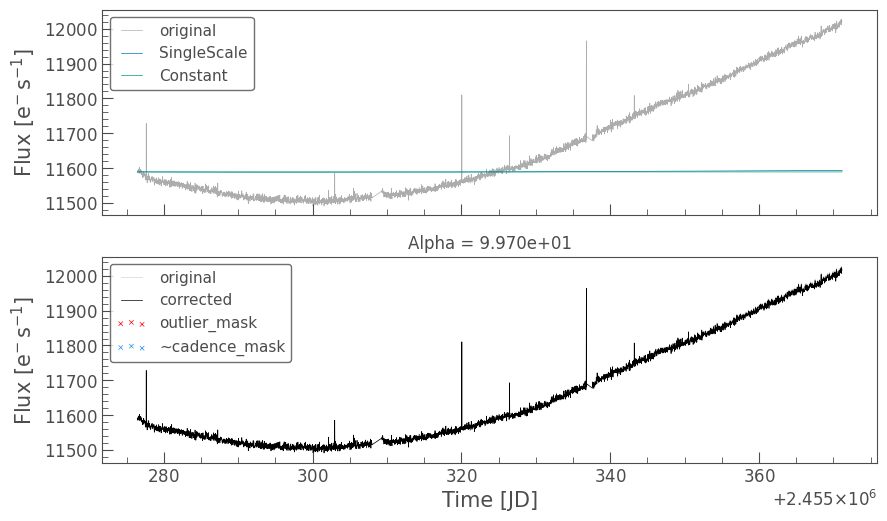

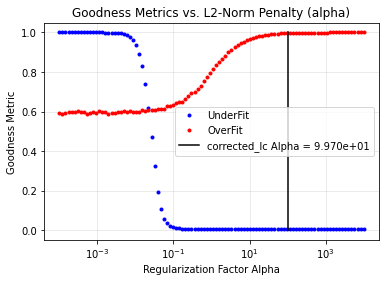

In [47]:
exba.apply_CBV(plot=True)

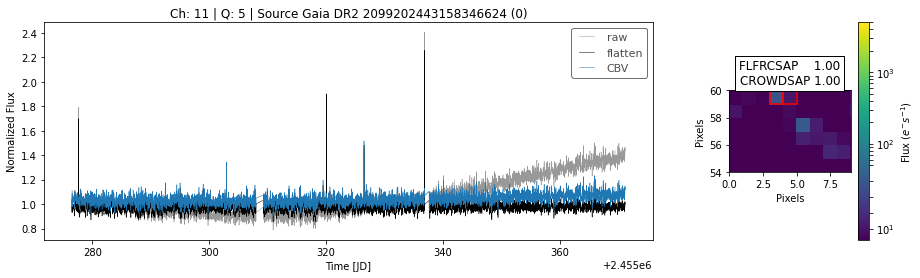

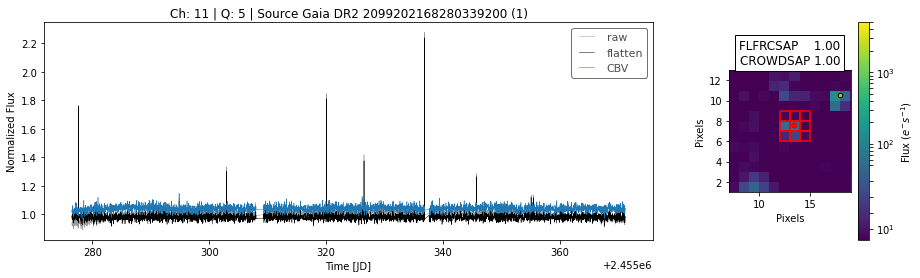

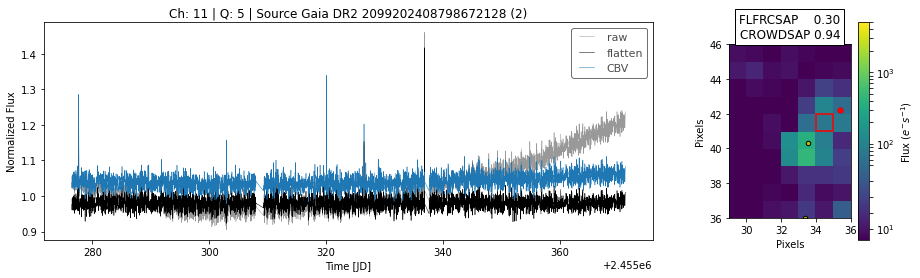

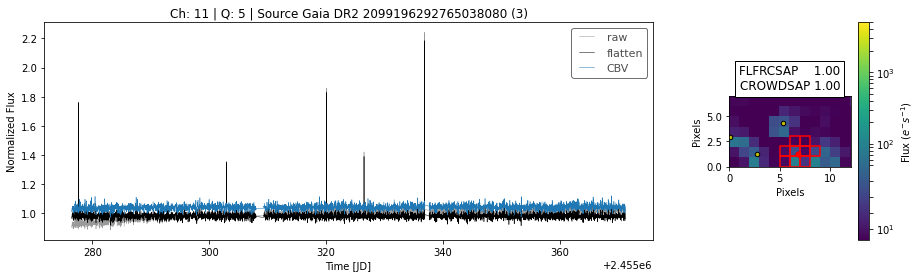

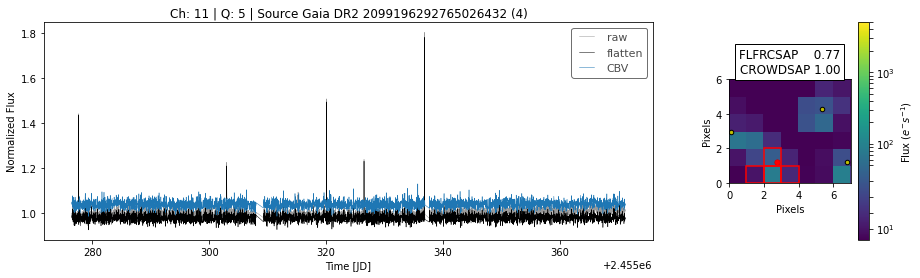

...

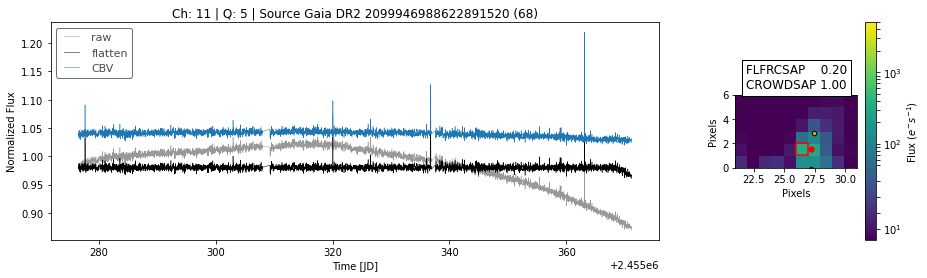

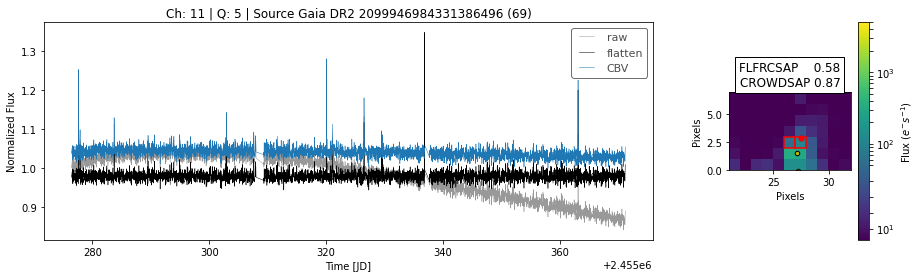

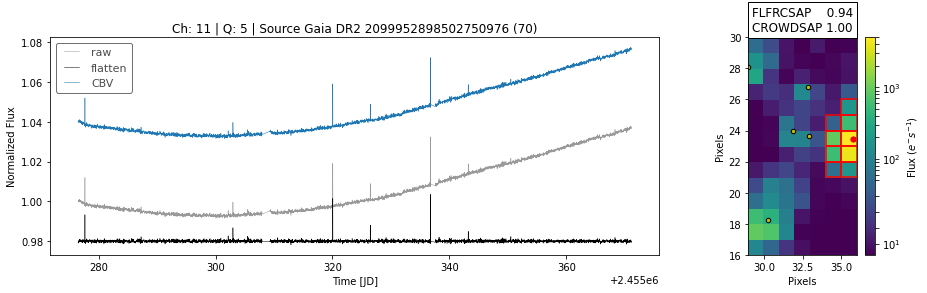

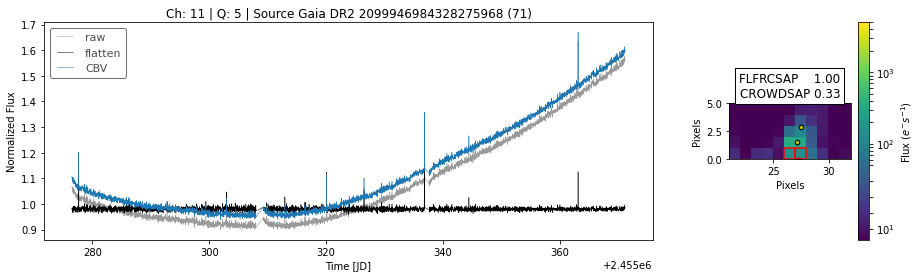

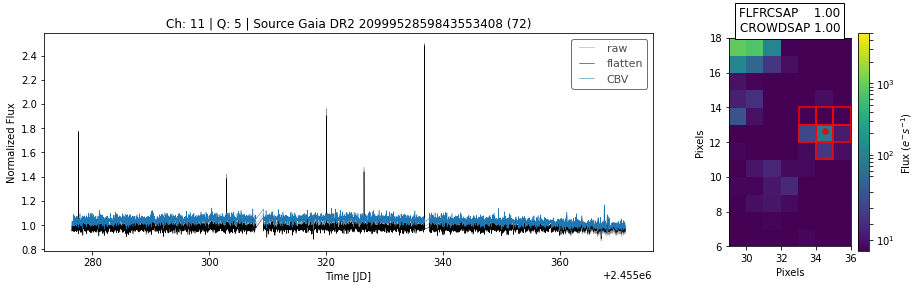

In [48]:
exba.plot_lightcurves_stamps(which="all")

In [64]:
exba.store_data()

BLS search:   0%|          | 0/73 [00:00<?, ?it/s]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


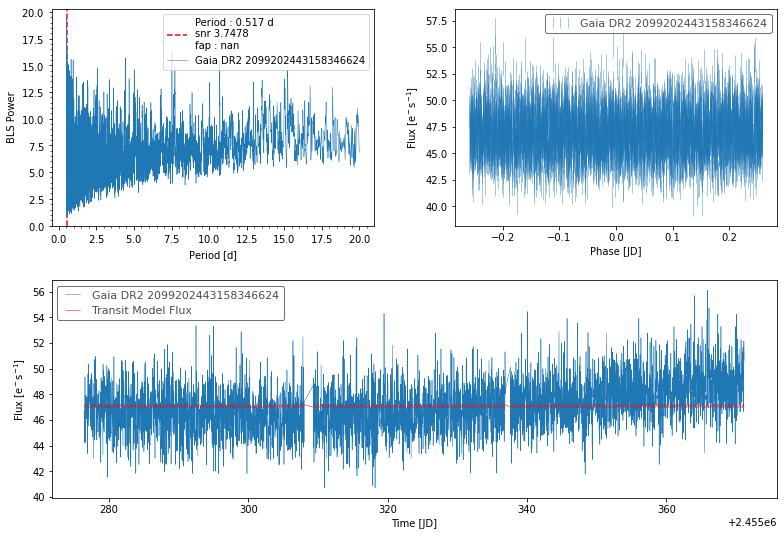

BLS search:   1%|▏         | 1/73 [00:20<24:39, 20.55s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


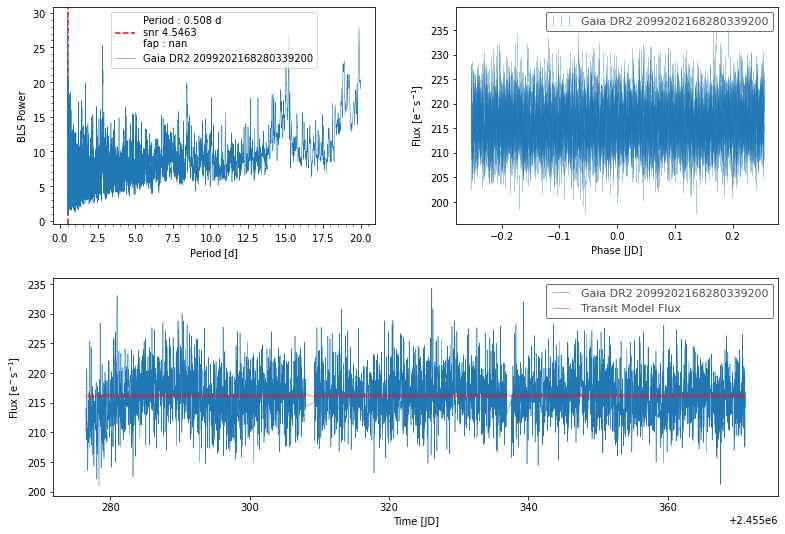

BLS search:   3%|▎         | 2/73 [00:40<23:35, 19.94s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


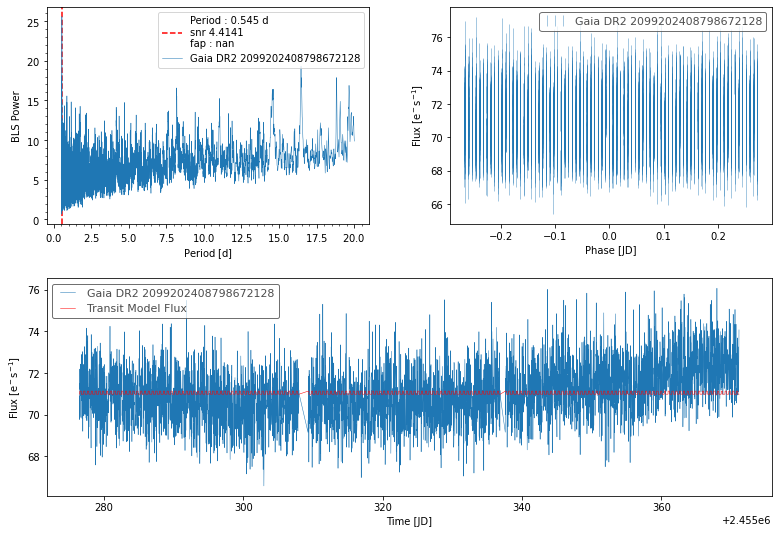

BLS search:   4%|▍         | 3/73 [01:01<24:06, 20.66s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


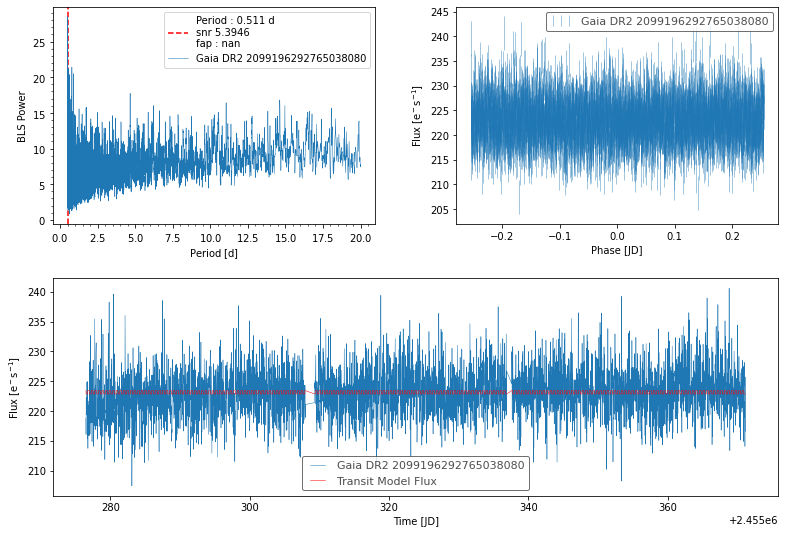

BLS search:   5%|▌         | 4/73 [01:15<20:38, 17.96s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


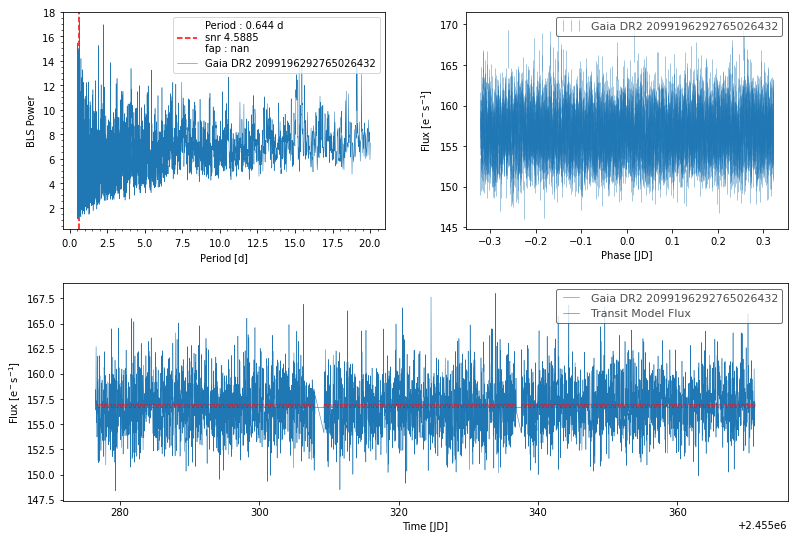

BLS search:   7%|▋         | 5/73 [01:32<20:11, 17.82s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


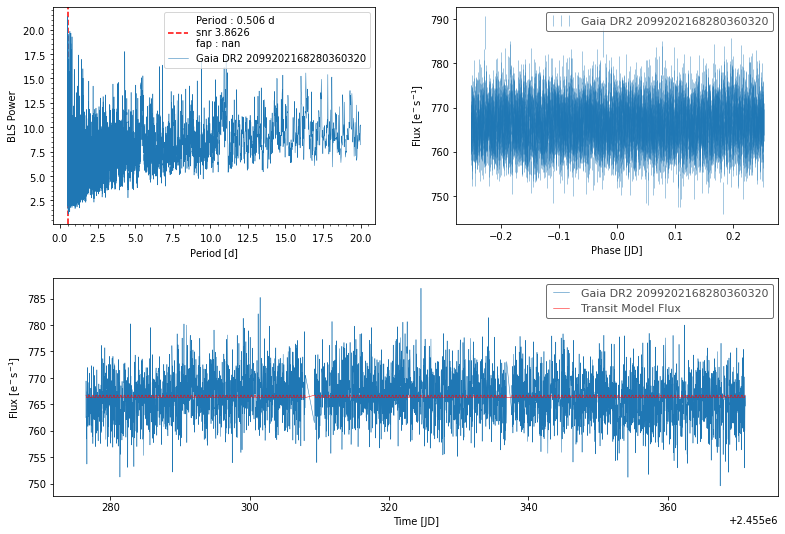

BLS search:   8%|▊         | 6/73 [01:45<17:48, 15.95s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


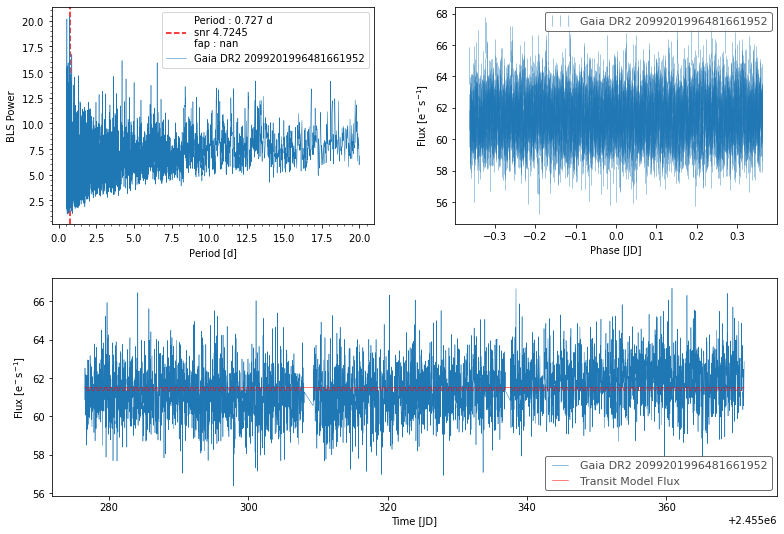

BLS search:  10%|▉         | 7/73 [01:57<16:21, 14.87s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


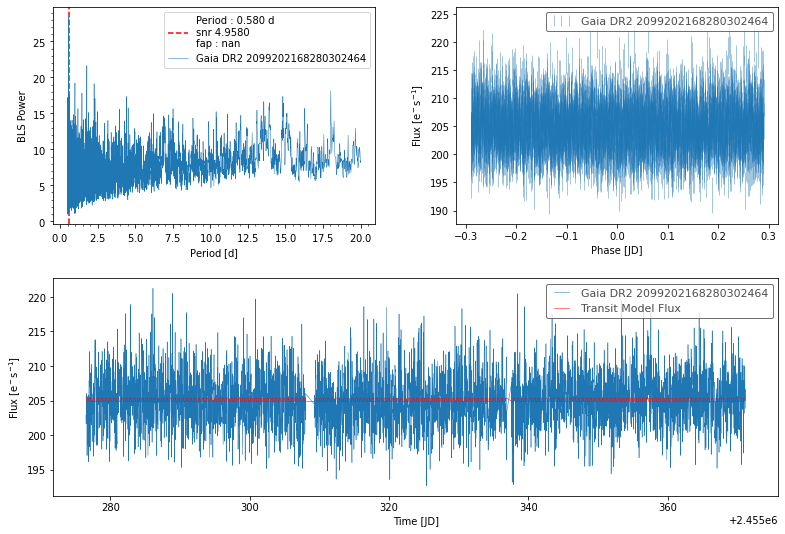

BLS search:  11%|█         | 8/73 [02:13<16:27, 15.19s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


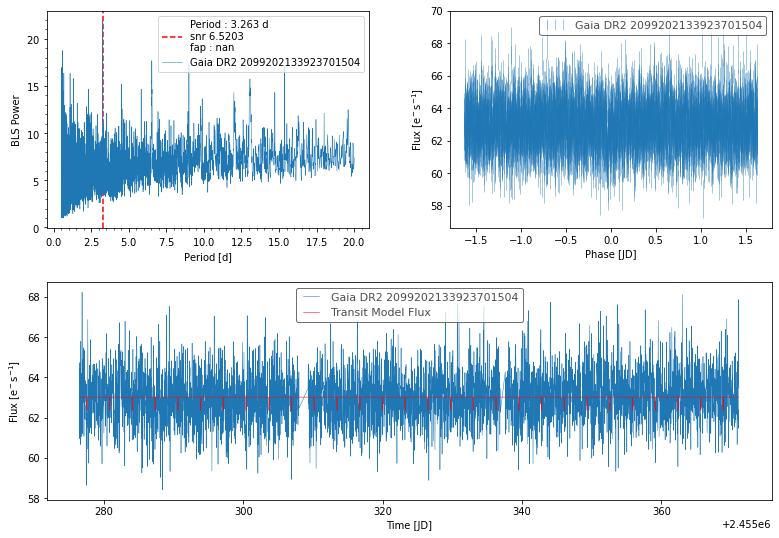

BLS search:  12%|█▏        | 9/73 [02:31<17:04, 16.01s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


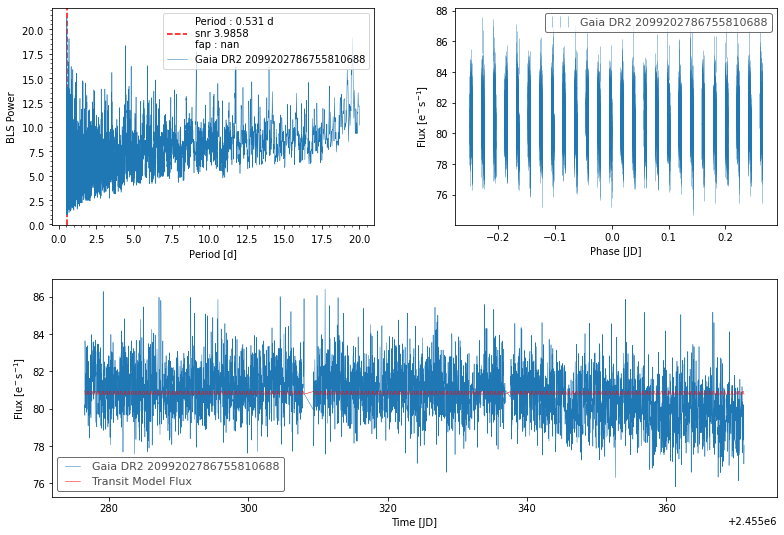

BLS search:  14%|█▎        | 10/73 [02:47<16:38, 15.85s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


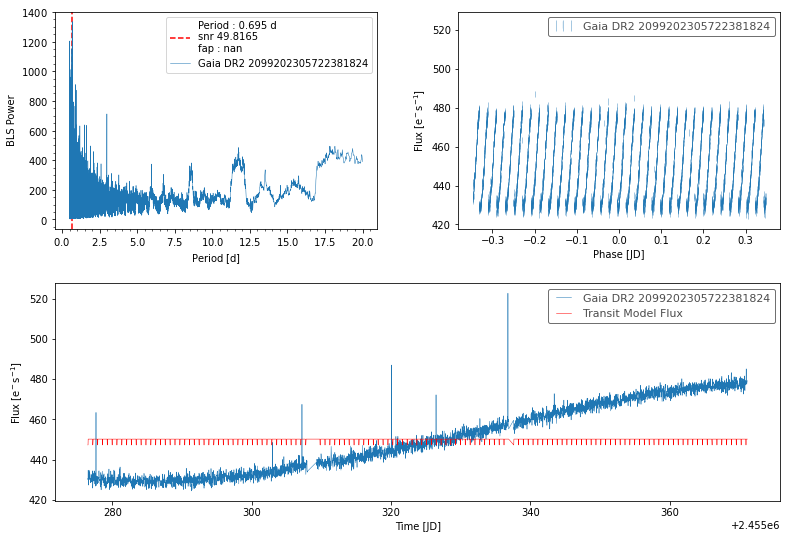

BLS search:  15%|█▌        | 11/73 [03:08<18:10, 17.58s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


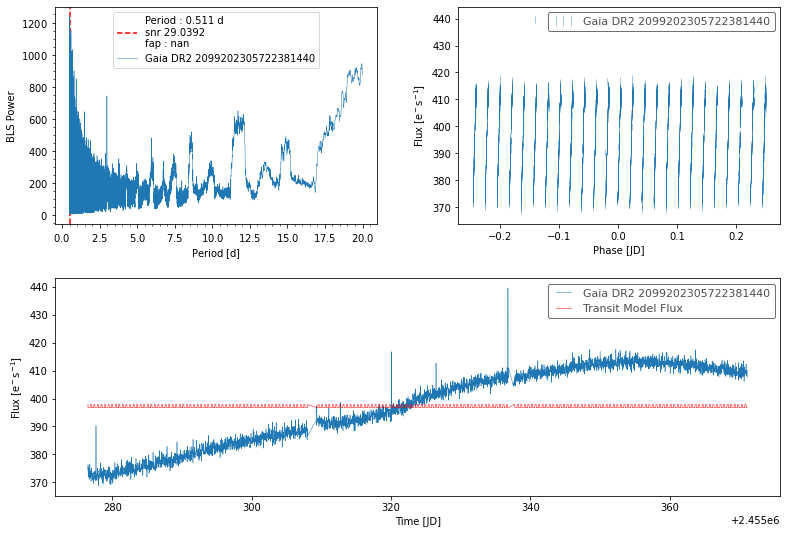

BLS search:  16%|█▋        | 12/73 [03:29<18:59, 18.68s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


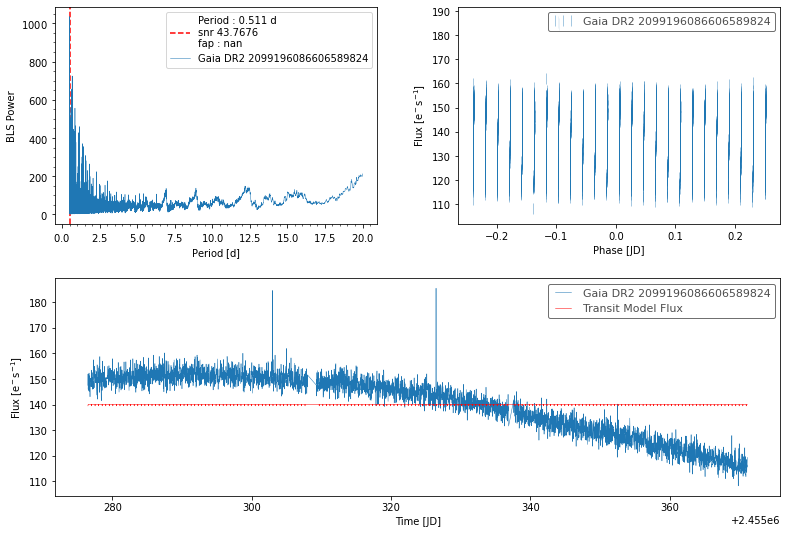

BLS search:  18%|█▊        | 13/73 [03:48<18:46, 18.77s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


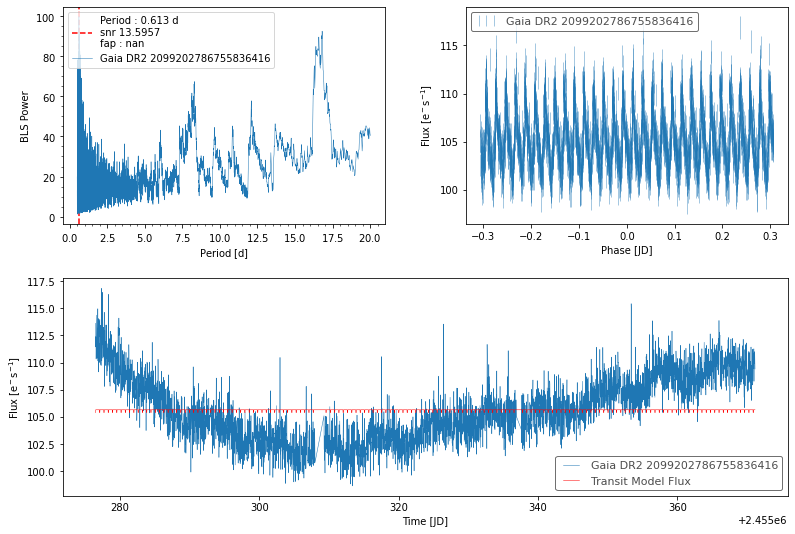

BLS search:  19%|█▉        | 14/73 [04:10<19:25, 19.75s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


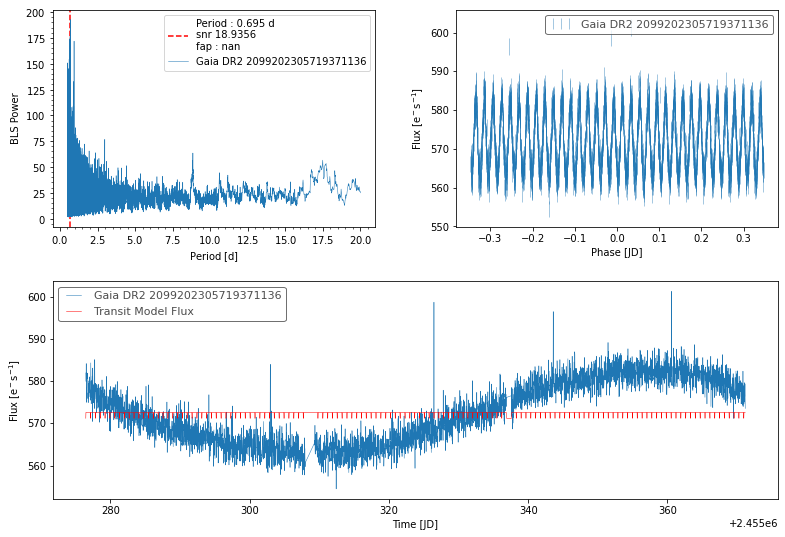

BLS search:  21%|██        | 15/73 [04:29<18:50, 19.50s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


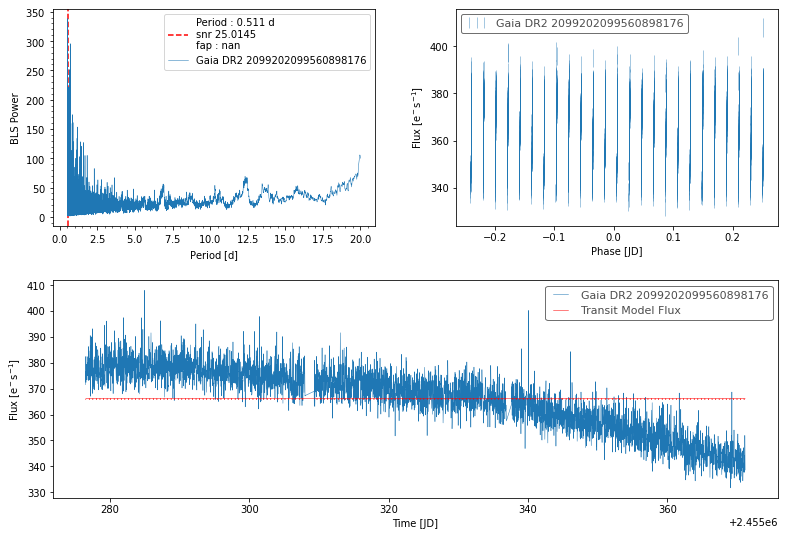

BLS search:  22%|██▏       | 16/73 [04:47<18:06, 19.07s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


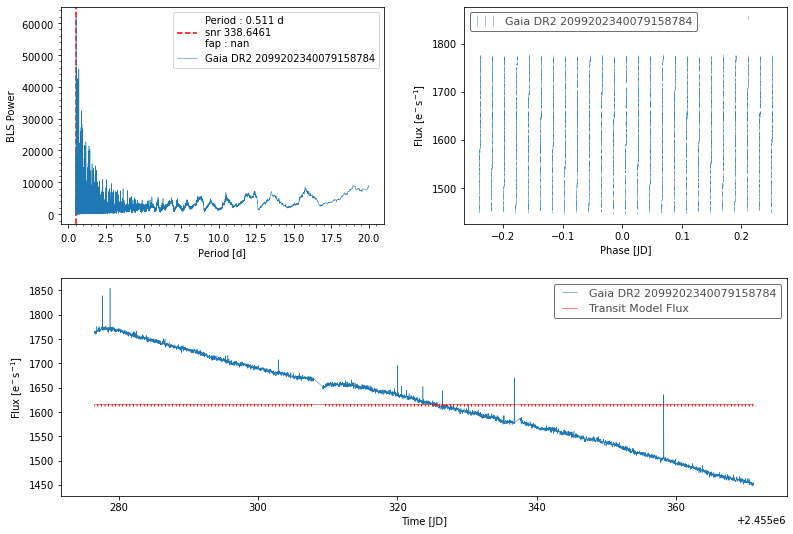

BLS search:  23%|██▎       | 17/73 [05:09<18:29, 19.82s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


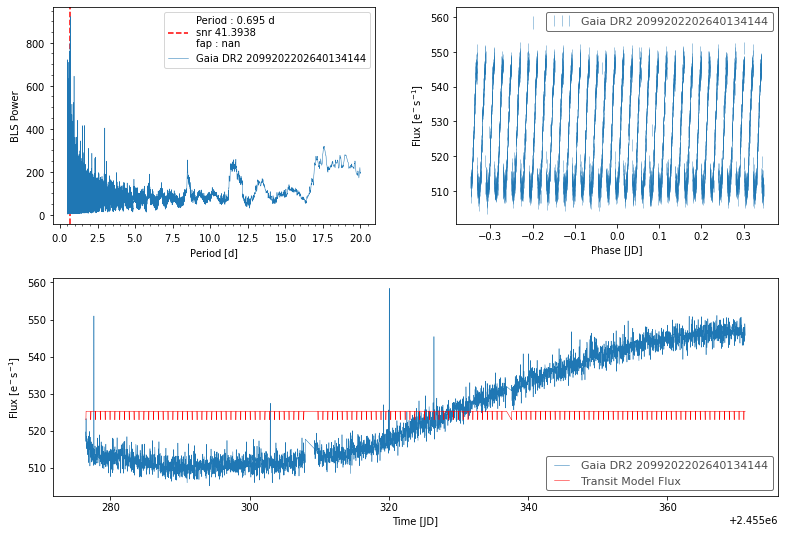

BLS search:  25%|██▍       | 18/73 [05:27<17:35, 19.20s/it]No period specified. Using period at max power
No duration specified. Using duration at max power
No transit time specified. Using transit time at max power


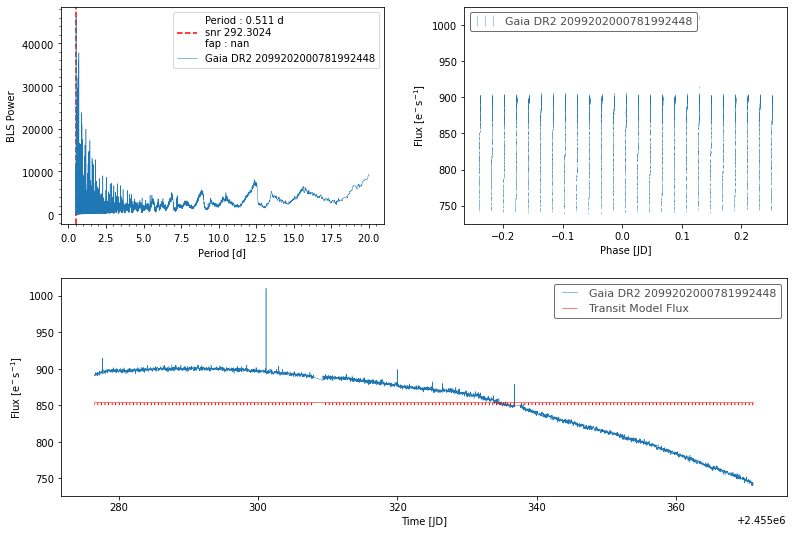

KeyboardInterrupt: 

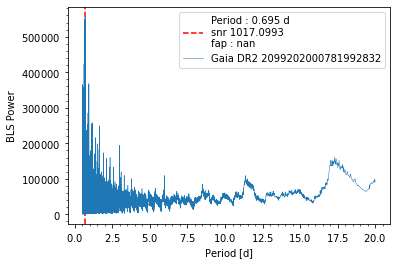

In [70]:
exba.do_bls_search(test_lcs=None, n_boots=0, plot=True)

## Test on TPFs

In [82]:
tpfs_paths = np.sort(glob.glob("../../EXBA_pathfinder/data/near/*.fits"))[4:]
tpfs = lk.TargetPixelFileCollection([lk.KeplerTargetPixelFile(f) for f in tpfs_paths])

In [85]:
tpfs_c = Machine.from_TPFs(tpfs, magnitude_limit=18)
tpfs_c

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
INFO: Query finished. [astroquery.utils.tap.core]


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


Machine (N sources, N times, N pixels): (377, 4492, 10555)

In [91]:
psf_tpfs = kpsf.evaluate_PSF(tpfs_c.flux, tpfs_c.dx, tpfs_c.dy, tpfs_c.source_flux_estimates[:, 0])
psf_tpfs

[3.53863359 1.77756666 1.66158144 1.97907118 3.01607346 1.08829454
 1.10304782 2.2798276  1.78108944 2.6657974  1.60548052 1.84600627
 1.26843528 1.71000427 1.78213023 1.86944497 1.92595492 2.82816616
 1.58493697 1.60197025 2.17474656 2.11269973 1.16139224 2.06736341
 1.9994345  1.98112995 1.88824269 1.86232343 2.00504437 1.65138705
 1.85547951 1.95994832 1.67824411 1.7825906  1.28234837 2.41536832
 1.16504    1.82646972 1.76614213 2.12166256 1.59121517 2.49986423
 1.04820311 2.13003477 2.83807266 1.61719578 2.72158531 2.50169365
 1.64163119 1.65995173 1.41087902 1.74542227 1.22651609 3.43159315
 2.39596517 2.02462414 1.95481156 3.7294447  1.54080256 2.49674287
 2.0842016  1.92138753 1.65605544 1.79106602 3.18743073 1.95619622
 2.54313169 1.90624538 1.88776865 2.3735695  1.17273224 1.74099337
 1.65387222 1.9097099  2.32412683 1.5680522  3.01247843 2.25392267
 1.82984218 2.01218989 2.88919522 2.44131019 1.76662018 1.20072526
 1.74673172 2.27679688 1.7290177  1.67637971 2.14715308 2.7939

<377x10555 sparse matrix of type '<class 'numpy.float64'>'
	with 4595 stored elements in Compressed Sparse Row format>

In [92]:
tpfs_c.aperture_mask = np.zeros_like(tpfs_c.dx).astype(bool)
tpfs_c.FLFRCSAP = np.zeros(tpfs_c.sources.shape[0])
tpfs_c.CROWDSAP = np.zeros(tpfs_c.sources.shape[0])
tpfs_c.cut = np.zeros(tpfs_c.sources.shape[0])

for s in range(tpfs_c.sources.shape[0]):
    ap_mask, crwd, cmplt, cut = kpsf.optimize_aperture(psf_tpfs, idx=s, target_complet=0.5, target_crowd=1.)
    tpfs_c.aperture_mask[s] = ap_mask
    tpfs_c.FLFRCSAP[s] = crwd
    tpfs_c.CROWDSAP[s] = cmplt
    tpfs_c.cut[s] = cut

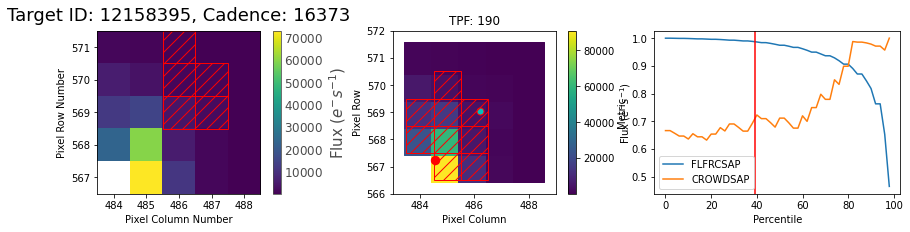

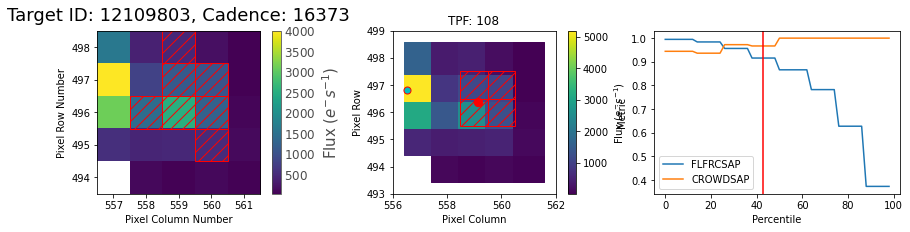

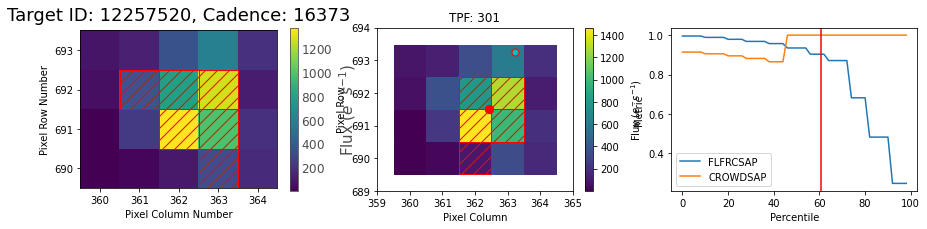

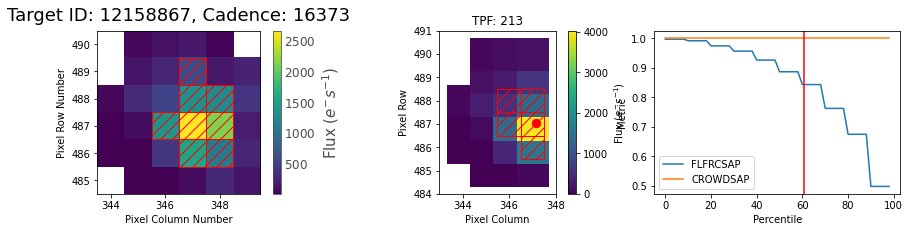

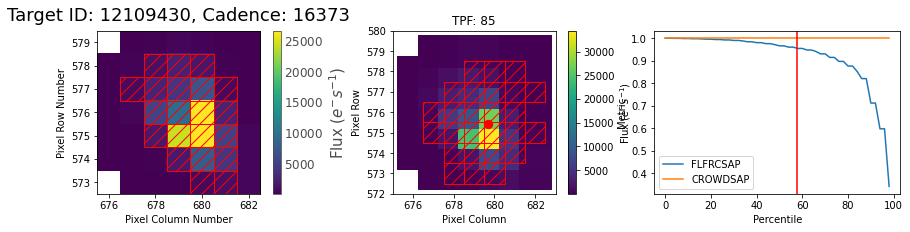

...

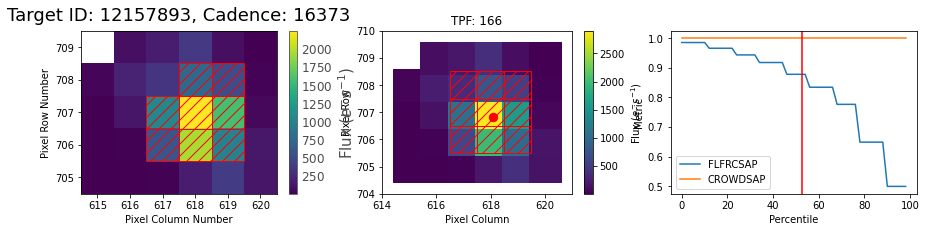

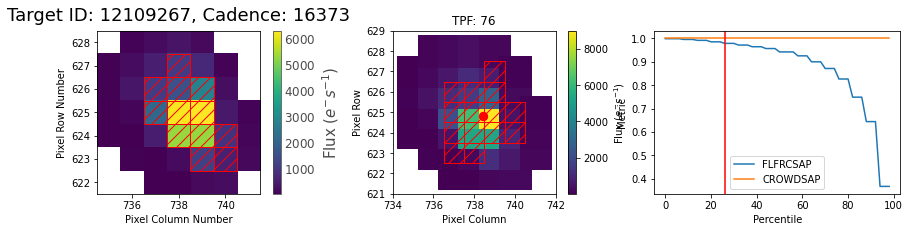

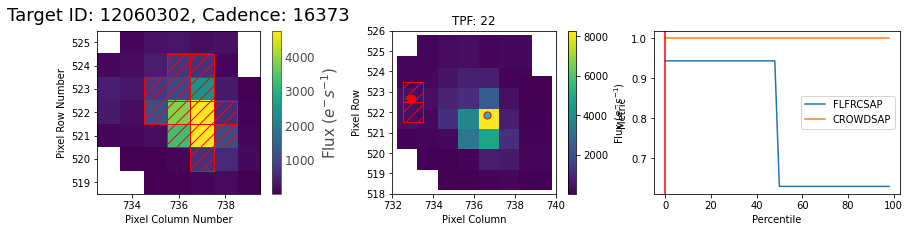

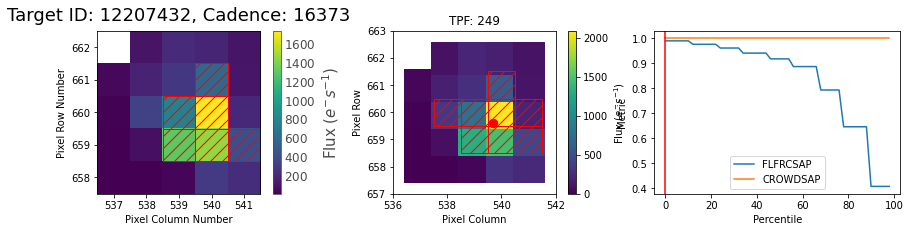

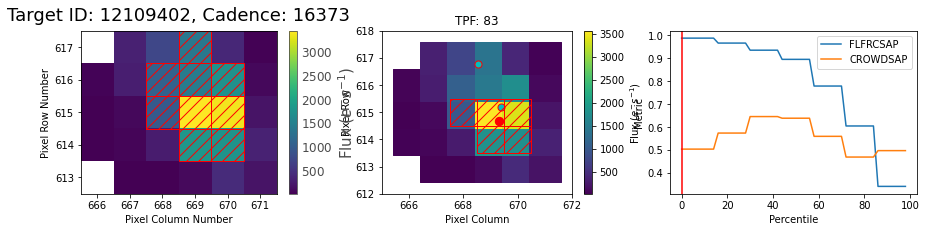

In [93]:
for s in range(exba.sources.shape[0]):
    fig, ax = plt.subplots(1, 3, figsize=(15,3))
    tpfs[tpfs_c.sources.loc[s, "tpf"]].plot(aperture_mask='pipeline', ax=ax[0]);
    ax[1] = tpfs_c.plot_source(s, ax=ax[1])
    ax[2] = kpsf.diagnose_metrics(psf_tpfs, idx=s, ax=ax[2])
    ax[2].axvline(exba.cut[s], ls='-', c='r')
    plt.show()
    # break

In [99]:
planet_lc = lk.search_lightcurve("Kepler-8", 
                                 author="Kepler", 
                                 cadence="long").download_all()

In [106]:
planet_lc[0]["quality"].max()

12352